In [1]:
# Import libraries

import os
import sys
sys.path.append("..")

import torch
import utils
import data_utils
import DnD_models
import scoring_function

import pandas as pd
import random
import numpy as np

from diffusers import StableDiffusionPipeline
from diffusers import DPMSolverMultistepScheduler

from transformers import BlipProcessor, BlipForConditionalGeneration

In [2]:
os.chdir('../')

In [3]:
# Define variables for dissection

figure = 'fig0'

settings = {'fig0': {"d_probe":'imagenet_broden', "target_name":'resnet50', "target_layer": 'layer2', "ids_to_check": [312]}, 
            'fig0': {"d_probe":'imagenet_broden', "target_name":'resnet50', "target_layer": 'layer3', "ids_to_check": [927, 419, 370, 706, 72, 325, 78, 5, 404, 436, 937, 50, 624, 220, 815, 139, 999, 496]},
           }

clip_name = 'ViT-B/16'
target_name = settings[figure]["target_name"]
target_layer = settings[figure]["target_layer"]
d_probe = settings[figure]["d_probe"]

batch_size = 200
device = 'cuda'
pool_mode = 'avg'

results_dir = 'exp_results'
saved_acts_dir = 'saved_activations'
num_images_to_check = 10
blip_batch_size = 10
tag = "test"

ids_to_check = settings[figure]["ids_to_check"]

In [4]:
# Load BLIP model

BLIP_PATH = "./models/pretrained_blip.pth"

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device) 
pretrained_dict = torch.load(BLIP_PATH)
model_dict = model.state_dict()
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}
model_dict.update(pretrained_dict)
model.load_state_dict(model_dict)
model.eval()

/tmp/ipykernel_1010/3973216471.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretrained_dict = torch.load(BLIP_PATH)


BlipForConditionalGeneration(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-0

In [5]:
# Initialize Stable Diffusion

model_id = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
generator = torch.Generator(device=device).manual_seed(0)
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
# Setting up file/directory paths for saving results
pot_column_names = ['Neuron ID'] + ['Concept {}'.format(i) for i in range(5)]
all_concepts = pd.DataFrame(columns=pot_column_names)
result_column_names = ['Neuron ID', 'Label 1']
final_concepts = pd.DataFrame(columns=result_column_names)

# Create results folder
results_path = utils.create_layer_folder(results_dir = results_dir, base_dir = ".", target_name = target_name, 
                          d_probe = d_probe, layer = target_layer, tag = tag)

In [7]:
# Get activations
target_save_name = utils.get_save_names(target_name = target_name,
                                  target_layer = target_layer, d_probe = d_probe,
                                  pool_mode=pool_mode, base_dir = '.', saved_acts_dir = saved_acts_dir)

utils.save_activations(target_name = target_name, target_layers = [target_layer],
                       d_probe = d_probe, batch_size = batch_size, device = device,
                       pool_mode=pool_mode, base_dir = '.', saved_acts_dir = saved_acts_dir)

target_feats = torch.load(target_save_name, map_location='cpu')

pil_data = data_utils.get_data(d_probe)

/tmp/ipykernel_1010/3116229814.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  target_feats = torch.load(target_save_name, map_location='cpu')


In [8]:
# Find top activating images
top_vals, top_ids = torch.topk(target_feats, k=num_images_to_check, dim=0)

all_imgs = []
all_img_ids = {neuron_id:[] for neuron_id in ids_to_check}

# Find top activating image crops
for t, orig_id in enumerate(ids_to_check):
    print("Cropping for Neuron {}/{}".format(t+1,len(ids_to_check)))
    
    activating_images = []
    for i, top_id in enumerate(top_ids[:, orig_id]):
        
        # Reshape activating images
        im, label = pil_data[top_id]
        im = im.resize([375,375])
        
        # Add image to d_probe with image ID
        all_img_ids[orig_id].append(len(all_imgs))
        all_imgs.append(im)
        activating_images.append(im)
        
    cropped_images = []
    
    # Get crops - FC layers do not have feature maps
    if(target_layer != 'fc'):
        cropped_images = DnD_models.get_attention_crops(target_name, activating_images, orig_id, num_crops_per_image = 4, target_layers = [target_layer], device = device)

    # Add crops into d_probe with image ID
    for img in cropped_images:
        all_img_ids[orig_id].append(len(all_imgs))
        all_imgs.append(img)

Cropping for Neuron 1/18
Cropping for Neuron 2/18
Cropping for Neuron 3/18
Cropping for Neuron 4/18
Cropping for Neuron 5/18
Cropping for Neuron 6/18
Cropping for Neuron 7/18
Cropping for Neuron 8/18
Cropping for Neuron 9/18
Cropping for Neuron 10/18
Cropping for Neuron 11/18
Cropping for Neuron 12/18
Cropping for Neuron 13/18
Cropping for Neuron 14/18
Cropping for Neuron 15/18
Cropping for Neuron 16/18
Cropping for Neuron 17/18
Cropping for Neuron 18/18


Neuron: 927 (1/18)


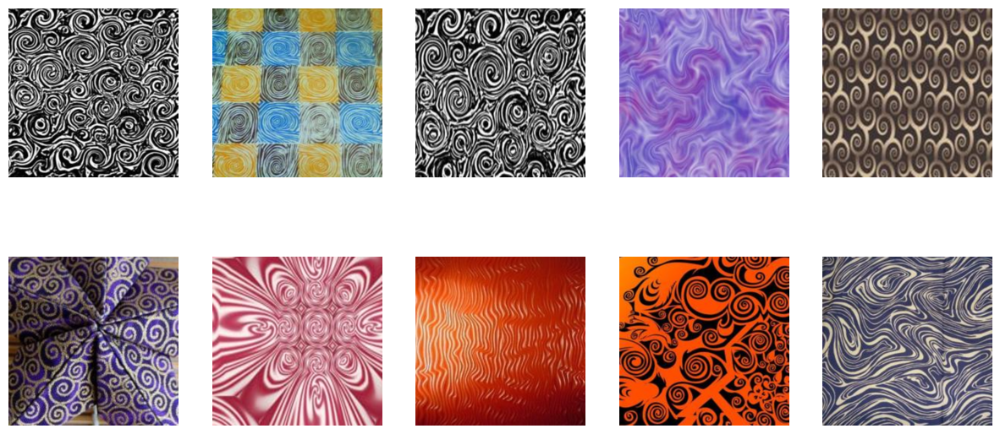

100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


DnD Concept Generation Label for Neuron 927: Abstract Patterns
Neuron: 419 (2/18)


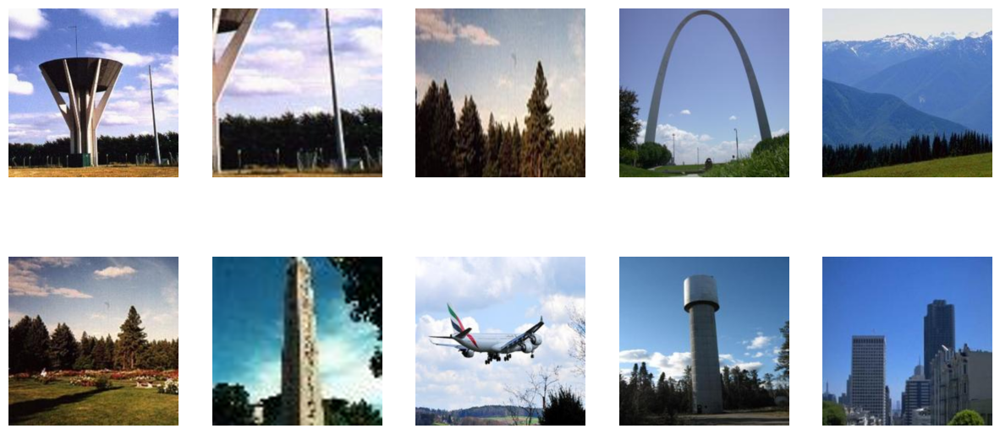

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


DnD Concept Generation Label for Neuron 419: Scenic Views
Neuron: 370 (3/18)


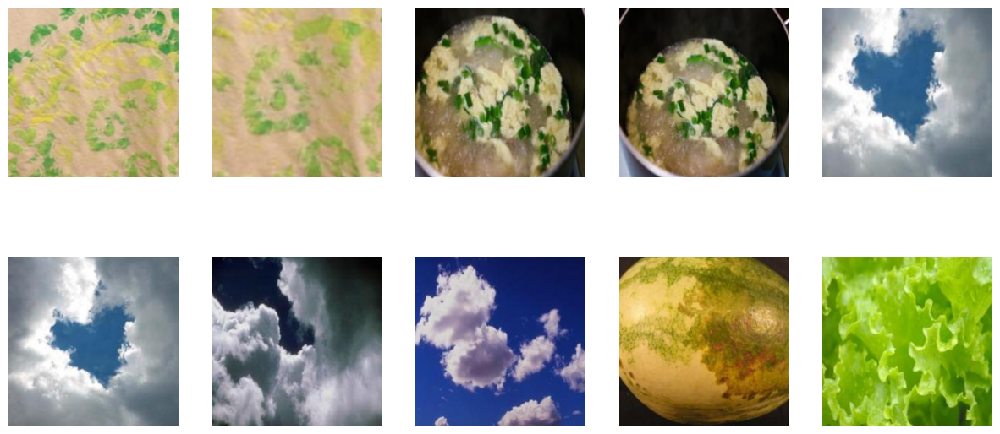

100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


DnD Concept Generation Label for Neuron 370: Varied Visual Elements
Neuron: 706 (4/18)


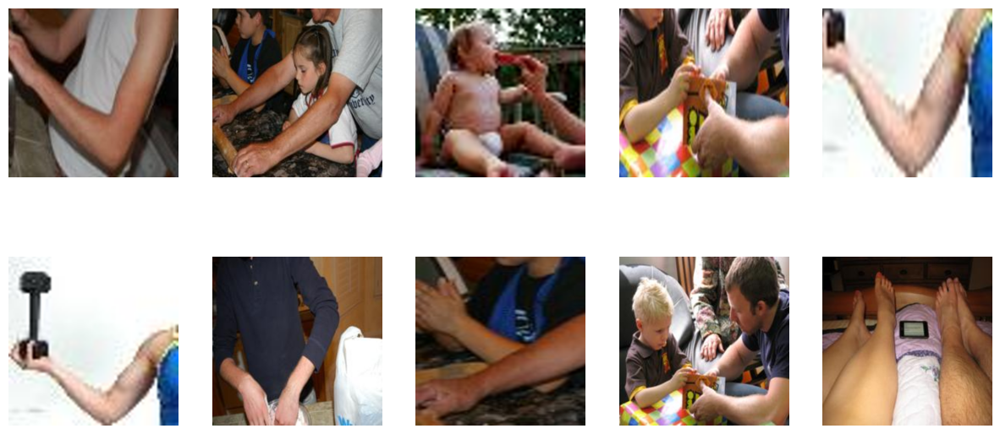

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


DnD Concept Generation Label for Neuron 706: Everyday Life Activities
Neuron: 72 (5/18)


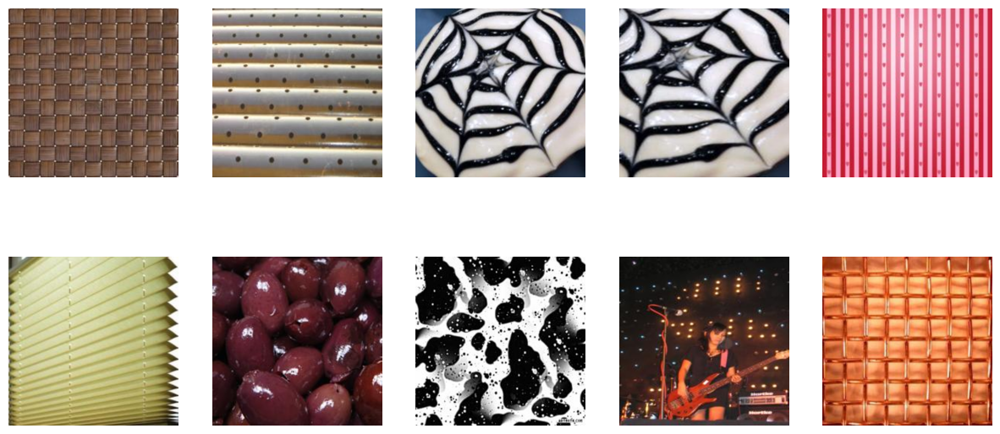

100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


DnD Concept Generation Label for Neuron 72: Textured Surfaces and Objects
Neuron: 325 (6/18)


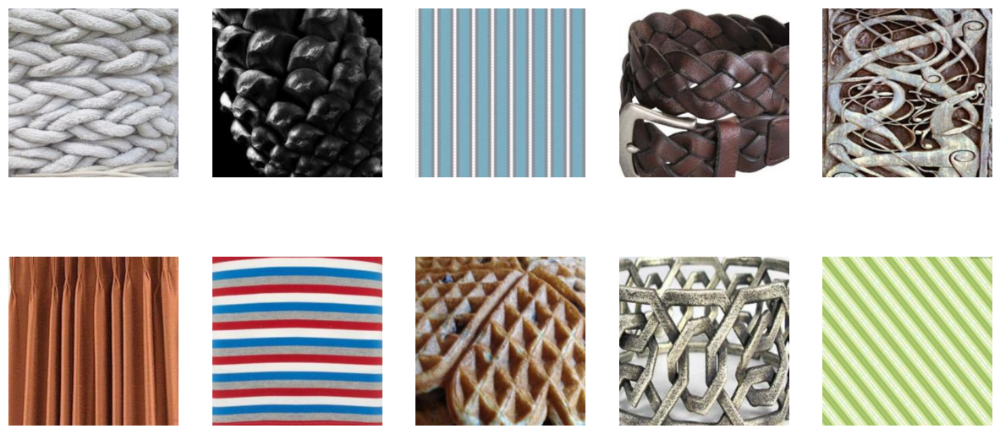

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


DnD Concept Generation Label for Neuron 325: Textured Patterns
Neuron: 78 (7/18)


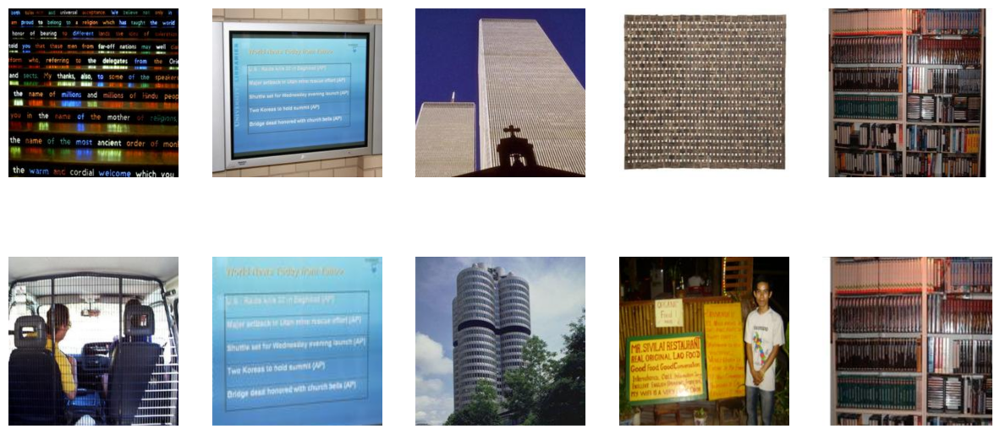

100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


DnD Concept Generation Label for Neuron 78: Diverse Urban Elements
Neuron: 5 (8/18)


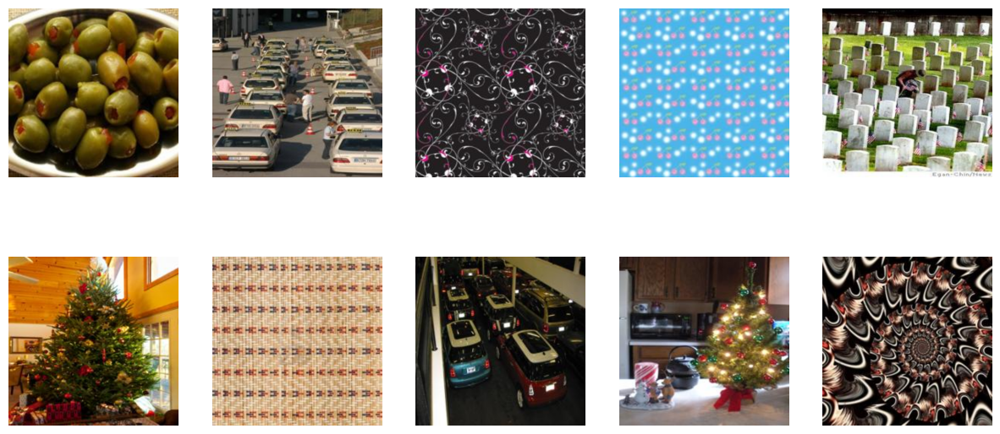

100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


DnD Concept Generation Label for Neuron 5: Diverse Patterns and Collections
Neuron: 404 (9/18)


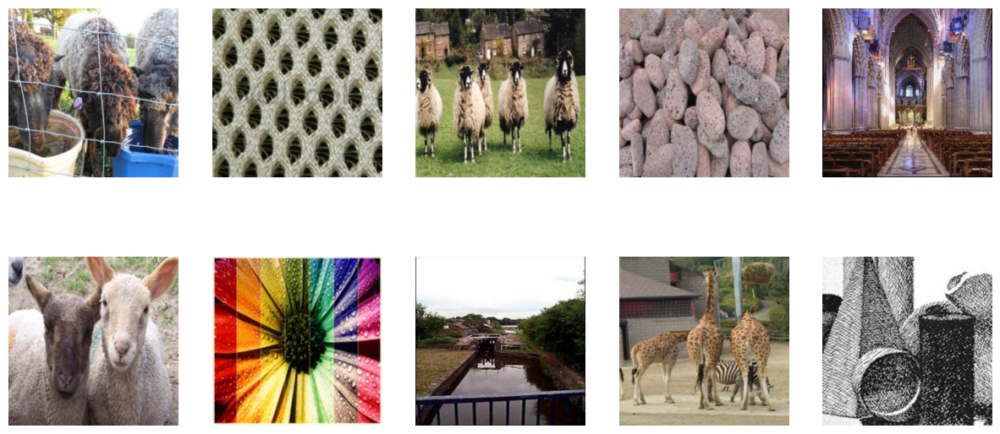

100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


DnD Concept Generation Label for Neuron 404: Diverse Textures and Scenes
Neuron: 436 (10/18)


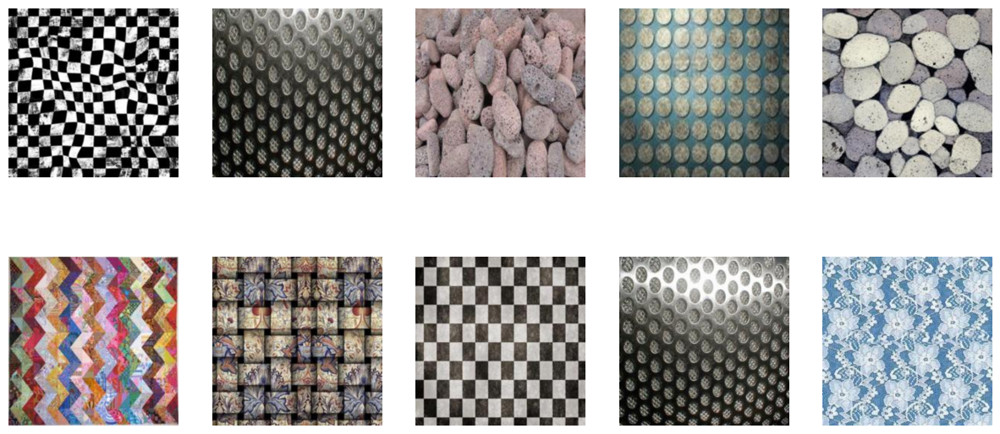

100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


DnD Concept Generation Label for Neuron 436: Textured Patterns
Neuron: 937 (11/18)


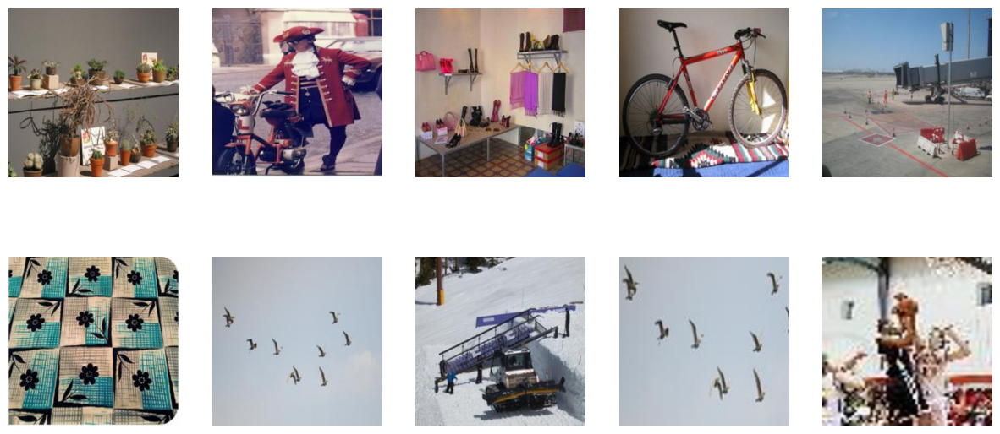

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


DnD Concept Generation Label for Neuron 937: Diverse Scenes
Neuron: 50 (12/18)


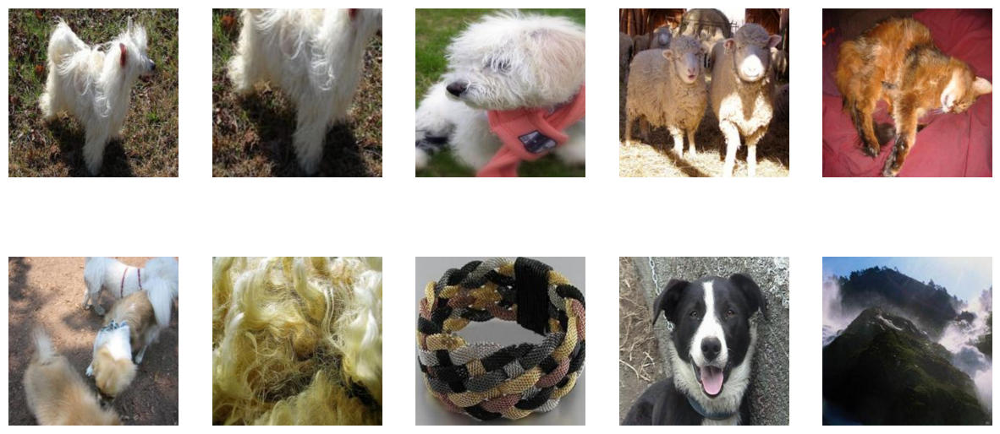

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


DnD Concept Generation Label for Neuron 50: Animal and Textile Imagery
Neuron: 624 (13/18)


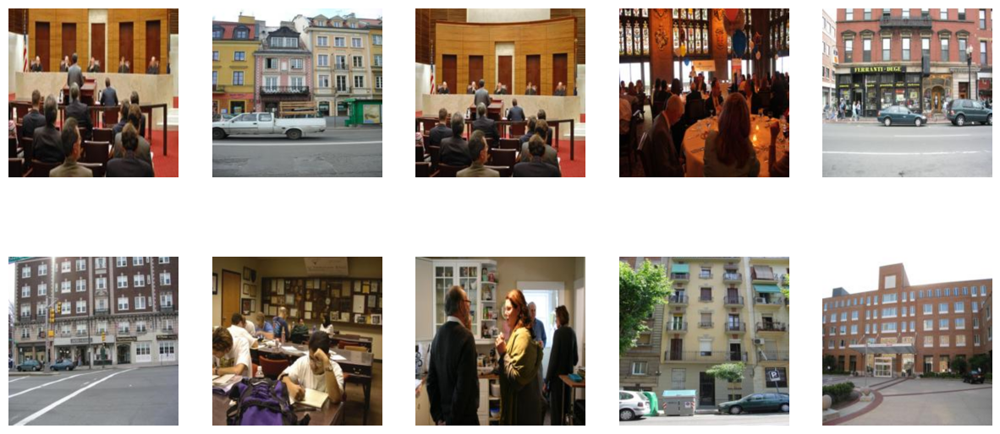

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


DnD Concept Generation Label for Neuron 624: Diverse settings
Neuron: 220 (14/18)


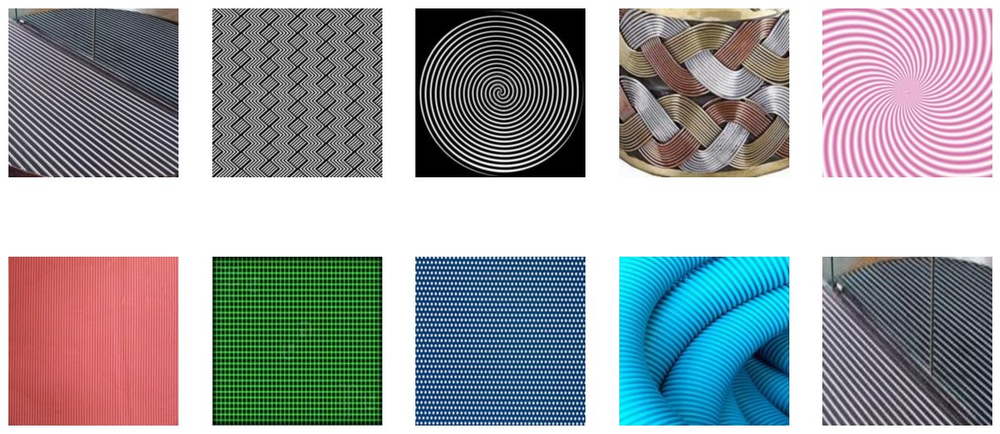

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


DnD Concept Generation Label for Neuron 220: Patterned designs
Neuron: 815 (15/18)


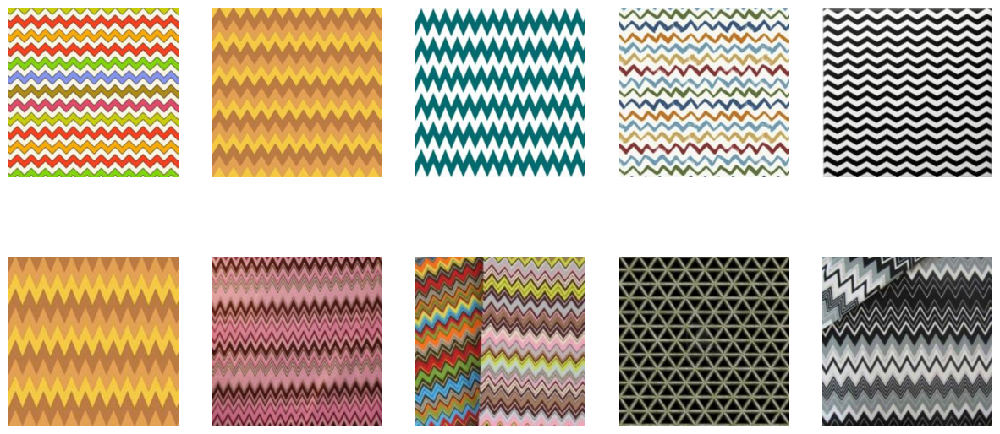

100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


DnD Concept Generation Label for Neuron 815: Pattern Varieties
Neuron: 139 (16/18)


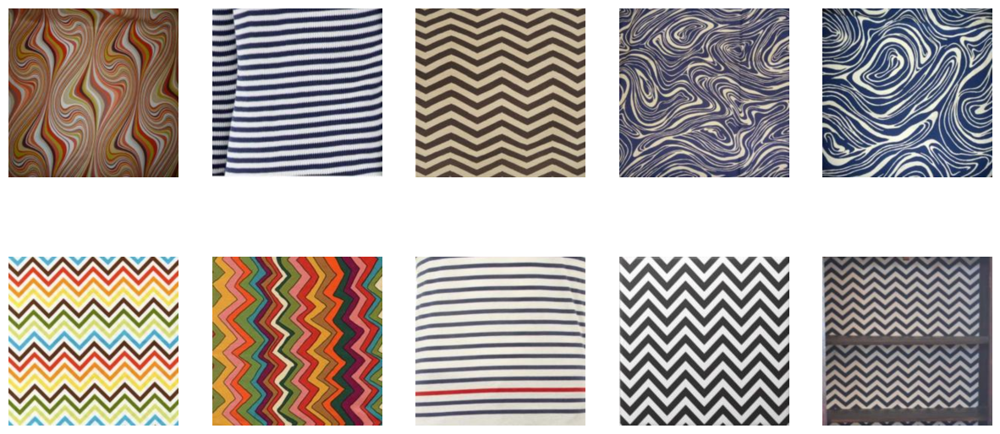

100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


DnD Concept Generation Label for Neuron 139: Patterned Textures
Neuron: 999 (17/18)


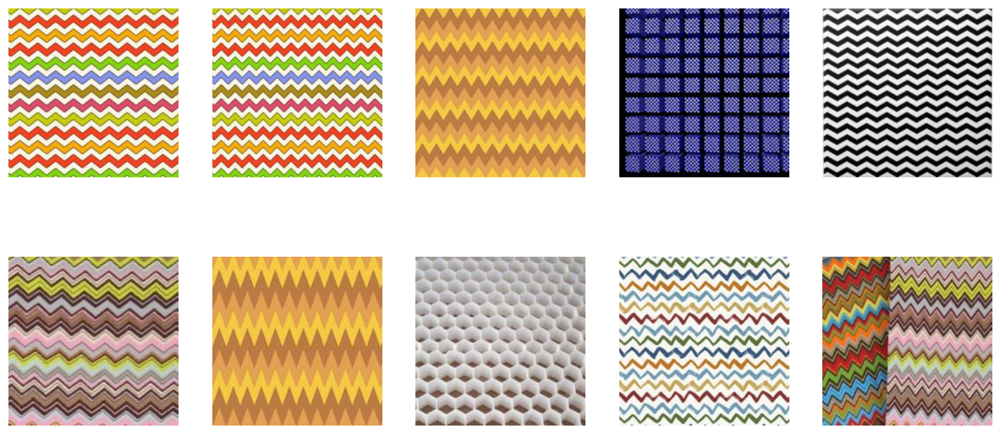

100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


DnD Concept Generation Label for Neuron 999: Pattern Variations
Neuron: 496 (18/18)


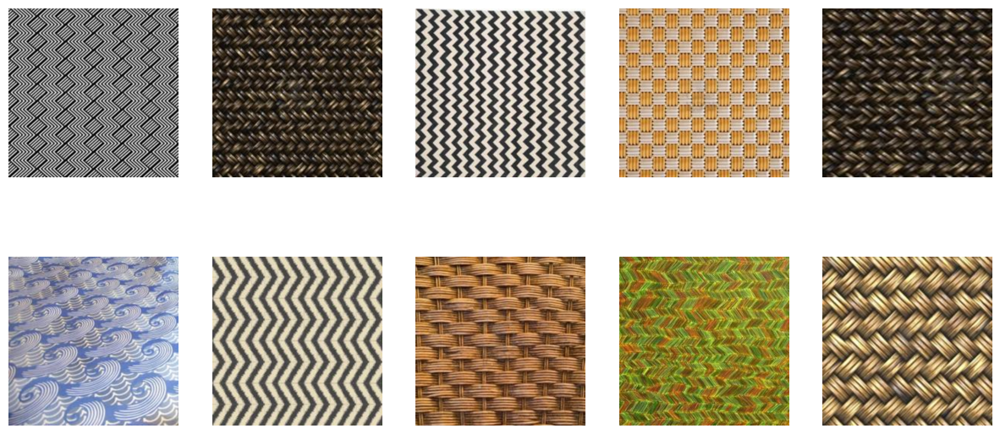

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


DnD Concept Generation Label for Neuron 496: Textured Patterns


In [9]:
# Get target activations with D_probe + D_cropped
target_feats = utils.get_target_activations(target_name, all_imgs, [target_layer])

# Find top activating images
top_vals, top_ids = torch.sort(target_feats, dim=0, descending = True)
comp_words = {orig_id : [] for orig_id in ids_to_check}
top_images = {orig_id:[] for orig_id in ids_to_check}

concept_df = pd.DataFrame(columns=["Neuron ID", "BLIP Caption", "GPT Simplified", "Final Concept"])

# Step 2 - Generate Candidate Concepts
concepts_list = []  # Store all concepts

for neuron_num, orig_id in enumerate(ids_to_check):
    print("Neuron: {} ({}/{})".format(orig_id, neuron_num+1, len(ids_to_check)))

    # Plot and save highest activating images
    fig, images, top_images = utils.get_top_images(orig_id, top_ids, top_images, 
                                                   all_imgs, all_img_ids, num_images_to_check, 
                                                   blip_batch_size)
    utils.save_activating_fig(fig, results_path, orig_id)
    
    # Generate BLIP Captions (Original)
    original_descriptions = DnD_models.blip_caption(model, processor, images, blip_batch_size, device)
    
    # Simplify Descriptions using GPT
    simplified_descriptions = [DnD_models.GPT_simplify(desc) for desc in original_descriptions]

    # Combine Simplified Descriptions into Final Label
    final_label = DnD_models.GPT_model_single(simplified_descriptions)

    # Store all information in a structured format
    concepts_list.append({
        "Neuron ID": orig_id,
        "Original Captions": original_descriptions[:5],  # Store top 5 original descriptions
        "Simplified Captions": simplified_descriptions[:5],  # Store top 5 simplified descriptions
        "Final Concept": final_label
    })

    print(f"DnD Concept Generation Label for Neuron {orig_id}: {final_label}")

# Convert list to DataFrame for structured storage
concept_df = pd.DataFrame(concepts_list)

utils.save_final_results(final_concepts, results_path)

In [10]:
# Expand the dataframe to have separate rows for each caption
expanded_concepts = []

for _, row in concept_df.iterrows():
    neuron_id = row["Neuron ID"]
    final_concept = row["Final Concept"]
    
    # Ensure lists are properly expanded
    original_captions = row["Original Captions"] if isinstance(row["Original Captions"], list) else [row["Original Captions"]]
    simplified_captions = row["Simplified Captions"] if isinstance(row["Simplified Captions"], list) else [row["Simplified Captions"]]

    # Make sure both lists have the same length
    max_len = max(len(original_captions), len(simplified_captions))
    
    for i in range(max_len):
        orig_caption = original_captions[i] if i < len(original_captions) else "N/A"
        simp_caption = simplified_captions[i] if i < len(simplified_captions) else "N/A"
        
        expanded_concepts.append([neuron_id, i + 1, orig_caption, simp_caption, final_concept])

# Convert into DataFrame
expanded_concept_df = pd.DataFrame(
    expanded_concepts,
    columns=["Neuron ID", "Caption #", "Original Caption", "Simplified Caption", "Final Concept"]
)

# Display the improved tabular format
import matplotlib.pyplot as plt
import seaborn as sns

# Increase display width for better visibility
pd.set_option("display.max_colwidth", None)

# Show DataFrame
expanded_concept_df

,Neuron ID,Caption #,Original Caption,Simplified Caption,Final Concept
0,927,1,a black and white swirl pattern,Monochrome swirl,Abstract Patterns
1,927,2,a painting of a checker with a checker on it,Checkerboard painting,Abstract Patterns
2,927,3,a black and white swirl pattern,Monochrome swirl,Abstract Patterns
3,927,4,a purple and blue background with a swirl pattern,Swirled purple-blue background,Abstract Patterns
4,927,5,a brown and black pattern with swirls,Swirled brown-black pattern,Abstract Patterns
...,...,...,...,...,...
85,496,1,a black and white pattern with a diagonal effect,Diagonal monochrome pattern,Textured Patterns
86,496,2,a brown woven fabric texture,Brown fabric texture,Textured Patterns
87,496,3,a black and white rug with a zig pattern,Zigzag rug,Textured Patterns
88,496,4,a woven fabric with a woven pattern,Woven fabric,Textured Patterns


In [11]:
# Ensure target_feats is a tensor
if isinstance(target_feats, torch.Tensor):
    target_feats = target_feats.cpu().numpy()  # Convert tensor to NumPy array

# Create `ranks` dictionary with activation values
ranks = {i: target_feats[:, i].tolist() for i in range(target_feats.shape[1])}  # One list per neuron

print("Formatted ranks:", list(ranks.keys())[:5])  # Debugging: Print first few neurons


Formatted ranks: [0, 1, 2, 3, 4]


In [12]:
# Apply scoring functions using properly formatted `ranks`
scoring_methods = {
    "Top-K Squared Mean": scoring_function.topk_sq_mean(ranks, k=5),
    "Mean": scoring_function.mean(ranks),
    "Median": scoring_function.median(ranks),
    "Squared Mean": scoring_function.sq_mean(ranks),
    "Top-K Log-Weighted Activation": scoring_function.log_weighted_activation_topk(ranks),
    "Top-K Semantic Consistency": scoring_function.semantic_consistency_score_topk(ranks, {})
}

# Store results in a DataFrame
ranking_df = pd.DataFrame(columns=["Scoring Method", "Neuron ID", "Rank", "Score"])

for method, ranked_neurons in scoring_methods.items():
    for rank, (score, neuron_id) in enumerate(ranked_neurons):
        ranking_df.loc[len(ranking_df)] = [method, neuron_id, rank + 1, score]

# Display ranking DataFrame for Neuron 927
ranking_df = ranking_df[ranking_df["Neuron ID"] == 927]
ranking_df

,Scoring Method,Neuron ID,Rank,Score
1023,Top-K Squared Mean,927,1024,0.565151
1605,Mean,927,582,0.037649
2233,Median,927,186,0.011822
3981,Squared Mean,927,910,0.011951
4125,Top-K Log-Weighted Activation,927,30,0.580204
5150,Top-K Semantic Consistency,927,31,0.551183


In [23]:
# Store multiple top-ranked concepts per scoring function
considered_concepts = []

# Loop through each scoring function
for method, ranked_neurons in scoring_methods.items():
    for rank, (score, neuron_id) in enumerate(ranked_neurons[:5]):  # Get top 5 ranked neurons
        neuron_id = int(neuron_id)  # Ensure standard int format
        
        # Check if the neuron has associated captions
        if neuron_id in expanded_concept_df["Neuron ID"].values:
            # Select relevant rows from expanded_concept_df
            matched_rows = expanded_concept_df[expanded_concept_df["Neuron ID"] == neuron_id]
            
            # Iterate over all available captions
            for _, row in matched_rows.iterrows():
                considered_concepts.append([
                    method, neuron_id, rank + 1, score, 
                    row["Caption #"], row["Original Caption"], row["Simplified Caption"], row["Final Concept"]
                ])
        else:
            # If neuron is missing, fill in "Not Found"
            considered_concepts.append([
                method, neuron_id, rank + 1, score, 
                "N/A", "Not Found", "Not Found", "Not Found"
            ])

# Convert to DataFrame
concept_score_df = pd.DataFrame(
    considered_concepts, 
    columns=["Scoring Method", "Neuron ID", "Rank", "Score", "Caption #", "Original Caption", "Simplified Caption", "Final Concept"]
)

# Display the updated DataFrame
concept_score_df


,Scoring Method,Neuron ID,Rank,Score,Caption #,Original Caption,Simplified Caption,Final Concept
0,Top-K Squared Mean,419,1,1.993567e-08,1,a large tower with a sky background,Skyline Tower,Scenic Landmarks
1,Top-K Squared Mean,419,1,1.993567e-08,2,a large white structure with a long metal structure,Bridge,Scenic Landmarks
2,Top-K Squared Mean,419,1,1.993567e-08,3,a large field with trees and a blue sky,Forest landscape,Scenic Landmarks
3,Top-K Squared Mean,419,1,1.993567e-08,4,a large arch in the sky,Rainbow,Scenic Landmarks
4,Top-K Squared Mean,419,1,1.993567e-08,5,a grassy field with a mountain range in the background,Mountainous landscape,Scenic Landmarks
...,...,...,...,...,...,...,...,...
85,Semantic Consistency,999,2,1.872924e-01,4,a blue and black background with squares,Blue-black square pattern,Pattern Variations
86,Semantic Consistency,999,2,1.872924e-01,5,black and white che che che che che che che che che che che che che che che che che che,Black and white pattern,Pattern Variations
87,Semantic Consistency,437,3,1.700348e-01,N/A,Not Found,Not Found,Not Found
88,Semantic Consistency,506,4,1.666358e-01,N/A,Not Found,Not Found,Not Found
